UC Boulder MSDS course work <br>
DTSA 5511 Deep Learning <br>

## Mini-Project <br> Photo to Monet Style Images CycleGAN

This [notebook](https://github.com/elfchildRichter/Monet_Style_Images_CycleGAN) uses **cycleGAN** to generate Monet-style images from photos. The data is sourced from [kaggle](https://www.kaggle.com/competitions/gan-getting-started) and includes **monet_tfrec** - 300 Monet paintings sized 256x256 in TFRecord format, and **photo_tfrec** 7028 photos sized 256x256 in TFRecord format.


## Setting and Import

In [1]:
# !pip install -U tensorflow==2.16.1 keras==3.1.1

In [2]:
import os
import re
import numpy as np
import random
from io import BytesIO
import zipfile

%matplotlib inline
import matplotlib.pyplot as plt
plt.rcParams.update({'font.size': 10})

import keras
from keras.utils import array_to_img
import tensorflow as tf
from tensorflow.keras import layers, initializers
from tensorflow.keras.losses import BinaryCrossentropy, Reduction
from scipy.linalg import sqrtm
from tensorflow.keras.callbacks import Callback

IN_COLAB = os.getenv("COLAB_RELEASE_TAG") is not None
ON_KAGGLE = os.getenv("KAGGLE_KERNEL_RUN_TYPE") is not None

np.random.seed(2004)
tf.random.set_seed(2004)

print(tf.__version__)

2.16.1


In [3]:
try:
    resolver = tf.distribute.cluster_resolver.TPUClusterResolver()
    print("Device:", resolver.master())
    tf.config.experimental_connect_to_cluster(resolver)
    tf.tpu.experimental.initialize_tpu_system(resolver)
    strategy = tf.distribute.TPUStrategy(resolver)
    print("on TPU")
except ValueError as e:
    print(e)
    print("not on TPU")
    strategy = tf.distribute.MirroredStrategy()

print("REPLICAS:", strategy.num_replicas_in_sync)

AUTOTUNE = tf.data.AUTOTUNE

Please provide a TPU Name to connect to.
not on TPU
REPLICAS: 1


In [4]:
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            print("Found GPU:", gpu)
    except RuntimeError as e:
        print(e)
else:
    print("GPU not found.")


Found GPU: PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')


In [5]:
if strategy.num_replicas_in_sync == 1:
    BATCH_SIZE = 2
    BUFFER_SIZE = 256
else:
    BATCH_SIZE_PER_REPLICA = 16
    BATCH_SIZE = BATCH_SIZE_PER_REPLICA * strategy.num_replicas_in_sync
    BUFFER_SIZE = 1024


In [7]:
if ON_KAGGLE:
  from kaggle_datasets import KaggleDatasets
  DATAFOLDER = "/kaggle/input/gan-getting-started"
  PATH = ''


## Data Analysis and Processing

In [8]:
MONET_FILENAMES = tf.io.gfile.glob(str(DATAFOLDER + '/monet_tfrec/*.tfrec'))
PHOTO_FILENAMES = tf.io.gfile.glob(str(DATAFOLDER + '/photo_tfrec/*.tfrec'))

In [9]:
def count_data_items(filenames):
    n = [int(re.compile(r"-([0-9]*)\.").search(filename).group(1)) for filename in filenames]
    return np.sum(n)

n_monet_samples = count_data_items(MONET_FILENAMES)
n_photo_samples = count_data_items(PHOTO_FILENAMES)

print(f'Monet TFRecord Files: {len(MONET_FILENAMES)}')
print(f'Monet images: {n_monet_samples}')
print(f'Photo TFRecord Files: {len(PHOTO_FILENAMES)}')
print(f'Photo images: {n_photo_samples}')


Monet TFRecord Files: 5
Monet images: 300
Photo TFRecord Files: 20
Photo images: 7038


In [10]:
IMAGE_SIZE = [256, 256]

def decode_image(image):
    image = tf.image.decode_jpeg(image, channels=3)
    image = (tf.cast(image, tf.float32) / 127.5) - 1 # Rescale to [-1, 1]
    image = tf.reshape(image, [*IMAGE_SIZE, 3])
    return image

def read_tfrecord(example):
    tfrecord_format = {
        "image": tf.io.FixedLenFeature([], tf.string)
    }
    example = tf.io.parse_single_example(example, tfrecord_format)
    image = decode_image(example['image'])
    return image

def load_dataset(filenames):
    dataset = tf.data.TFRecordDataset(filenames)
    dataset = dataset.map(read_tfrecord, num_parallel_calls=AUTOTUNE)
    return dataset


In [11]:
def display_images(data_name, dataset, n_images, batched=False):
    if batched:
        dataset = dataset.unbatch()

    dataset = dataset.take(n_images).batch(n_images)
    for images in dataset:
        plt.figure(figsize=[15, 7])
        for i in range(n_images):
            ax = plt.subplot(1, n_images, i + 1)
            plt.imshow((images[i]*0.5+0.5))
            plt.axis('off')
            plt.title(data_name)
        plt.show()

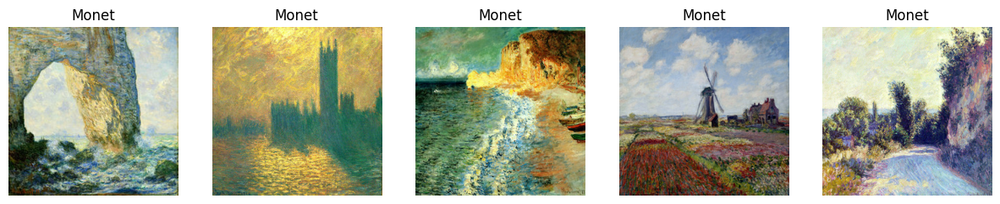

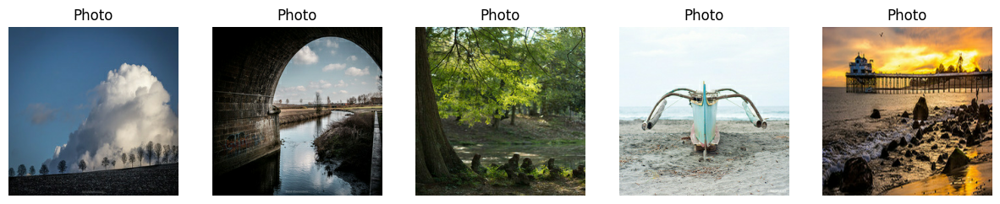

In [12]:
monet_ds = load_dataset(MONET_FILENAMES)
photo_ds = load_dataset(PHOTO_FILENAMES)

display_images('Monet', monet_ds, 5)
display_images('Photo', photo_ds, 5)

In [13]:
def augment_image(image):
    
    p_rotate = tf.random.uniform([], 0, 1.0, dtype=tf.float32)
    p_spatial = tf.random.uniform([], 0, 1.0, dtype=tf.float32)
    p_crop = tf.random.uniform([], 0, 1.0, dtype=tf.float32)

    if p_rotate > .9:
        image = tf.image.rot90(image, k=3) # rotate 270º
    elif p_rotate > .7:
        image = tf.image.rot90(image, k=2) # rotate 180º
    elif p_rotate > .5:
        image = tf.image.rot90(image, k=1) # rotate 90º

    if p_spatial > .6:
        image = tf.image.random_flip_left_right(image)
        image = tf.image.random_flip_up_down(image)
        if p_spatial > .9:
            image = tf.image.transpose(image)
    
    if p_crop > .5:
        image = tf.image.resize(image, [286, 286])
        image = tf.image.random_crop(image, size=[256, 256, 3])
        if p_crop > .9:
            image = tf.image.resize(image, [300, 300])
            image = tf.image.random_crop(image, size=[256, 256, 3])

    return image


In [14]:
monet_gan_ds = (monet_ds.cache()
                .map(augment_image, num_parallel_calls=AUTOTUNE)
                .repeat().shuffle(BUFFER_SIZE)
                .batch(BATCH_SIZE, drop_remainder=True).prefetch(AUTOTUNE)
                )
photo_gan_ds = (photo_ds.cache()
                .map(augment_image, num_parallel_calls=AUTOTUNE)
                .repeat().shuffle(BUFFER_SIZE)
                .batch(BATCH_SIZE, drop_remainder=True).prefetch(AUTOTUNE)
                )

fid_monet_ds = (monet_ds.take(1024)
                #.map(augment_image, num_parallel_calls=AUTOTUNE)
                .shuffle(BUFFER_SIZE)
                .batch(BATCH_SIZE).prefetch(AUTOTUNE)
                )
fid_photo_ds = (photo_ds.take(1024)
                #.map(augment_image, num_parallel_calls=AUTOTUNE)
                .shuffle(BUFFER_SIZE)
                .batch(BATCH_SIZE).prefetch(AUTOTUNE)
                )

test_photo_ds = photo_ds.shuffle(BUFFER_SIZE).batch(BATCH_SIZE).prefetch(AUTOTUNE)

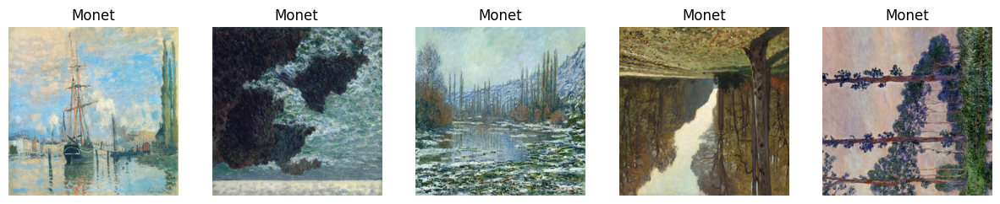

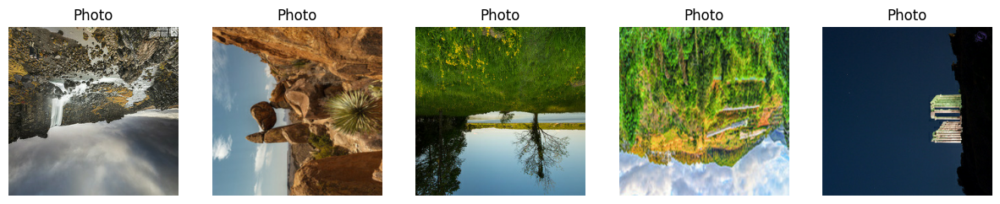

In [19]:
display_images('Monet', monet_gan_ds, 5, batched=True)
display_images('Photo', photo_gan_ds, 5, batched=True)

## CycleGAN

is a type of **Generative Adversarial Network (GAN)** architecture designed for image-to-image translation tasks without the need for paired data. It consists of two pairs of generators and discriminators: one pair for the transformation from domain A to domain B, and another for the transformation from domain B to domain A.

The task of the generators is to produce images realistic enough that the discriminators cannot distinguish between the transformed and the real images. The goal of the discriminators is to accurately differentiate between the transformed images and the real images from the original domain.

To ensure that the transformed images retain the key features of the original images, CycleGAN introduces the concept of **Cycle Consistency Loss**. This requires that an image, after being transformed from domain A to domain B and then back from domain B to domain A, should be as close to the original image as possible.

Here, **generator_m** is the generator that converts photos into Monet style images, and **generator_p** is the generator that converts Monet paintings into photos. **discriminator_m** is the discriminator for Monet paintings, and **discriminator_p** is the discriminator for photos.

In [22]:
class InstanceNormalization(layers.Layer):

    def __init__(self, epsilon=1e-5, gamma_initializer=initializers.RandomNormal(mean=0.0, stddev=0.02)):
        super(InstanceNormalization, self).__init__()
        self.epsilon = epsilon
        self.gamma_initializer = gamma_initializer

    def build(self, input_shape):
        self.scale = self.add_weight(
            name='scale',
            shape=input_shape[-1:],
            initializer=self.gamma_initializer,
            trainable=True,
        )
        self.offset = self.add_weight(
            name='offset',
            shape=input_shape[-1:],
            initializer='zeros',
            trainable=True,
        )

    def call(self, inputs):
        mean, variance = tf.nn.moments(inputs, axes=[1, 2], keepdims=True)
        inv = tf.math.rsqrt(variance + self.epsilon)
        normalized = (inputs - mean) * inv
        return self.scale * normalized + self.offset


In [23]:
def downsample(filters, size, apply_instancenorm=True):
    initializer = tf.random_normal_initializer(0., 0.02)
    gamma_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)

    result = keras.Sequential()
    result.add(layers.Conv2D(filters, size, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False))
    if apply_instancenorm:
        result.add(InstanceNormalization())
    result.add(layers.LeakyReLU())
    return result

def upsample(filters, size, apply_dropout=False):
    initializer = tf.random_normal_initializer(0., 0.02)
    gamma_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)

    result = keras.Sequential()
    result.add(layers.Conv2DTranspose(filters, size, strides=2,
                                      padding='same',
                                      kernel_initializer=initializer,
                                      use_bias=False))
    result.add(InstanceNormalization())
    if apply_dropout:
        result.add(layers.Dropout(0.3))
    result.add(layers.ReLU())
    return result

def Generator():
    inputs = layers.Input(shape=[256,256,3])
    output_channels = 3

    # bs = batch size
    down_stack = [
        downsample(64, 4, apply_instancenorm=False), # (bs, 128, 128, 64)
        downsample(128, 4), # (bs, 64, 64, 128)
        downsample(256, 4), # (bs, 32, 32, 256)
        downsample(512, 4), # (bs, 16, 16, 512)
        downsample(512, 4), # (bs, 8, 8, 512)
        downsample(512, 4), # (bs, 4, 4, 512)
        downsample(512, 4), # (bs, 2, 2, 512)
        downsample(512, 4), # (bs, 1, 1, 512)
    ]
    up_stack = [
        upsample(512, 4, apply_dropout=True), # (bs, 2, 2, 1024)
        upsample(512, 4, apply_dropout=True), # (bs, 4, 4, 1024)
        upsample(512, 4, apply_dropout=True), # (bs, 8, 8, 1024)
        upsample(512, 4), # (bs, 16, 16, 1024)
        upsample(256, 4), # (bs, 32, 32, 512)
        upsample(128, 4), # (bs, 64, 64, 256)
        upsample(64, 4), # (bs, 128, 128, 128)
    ]
    initializer = tf.random_normal_initializer(0., 0.02)
    last = layers.Conv2DTranspose(output_channels, 4,
                                  strides=2,
                                  padding='same',
                                  kernel_initializer=initializer,
                                  activation='tanh') # (bs, 256, 256, 3)
    x = inputs

    # Downsampling through the model
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)
    skips = reversed(skips[:-1])

    # Upsampling and establishing the skip connections
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = layers.Concatenate()([x, skip])

    x = last(x)
    return keras.Model(inputs=inputs, outputs=x)

def Discriminator():
    initializer = tf.random_normal_initializer(0., 0.02)
    gamma_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)

    inp = layers.Input(shape=[256, 256, 3], name='input_image')
    x = inp
    down1 = downsample(64, 4, False)(x) # (bs, 128, 128, 64)
    down2 = downsample(128, 4)(down1) # (bs, 64, 64, 128)
    down3 = downsample(256, 4)(down2) # (bs, 32, 32, 256)
    zero_pad1 = layers.ZeroPadding2D()(down3) # (bs, 34, 34, 256)
    conv = layers.Conv2D(512, 4, strides=1,
                         kernel_initializer=initializer,
                         use_bias=False)(zero_pad1) # (bs, 31, 31, 512)

    norm1 = InstanceNormalization()(conv)
    leaky_relu = layers.LeakyReLU()(norm1)
    zero_pad2 = layers.ZeroPadding2D()(leaky_relu) # (bs, 33, 33, 512)
    last = layers.Conv2D(1, 4, strides=1,
                         kernel_initializer=initializer)(zero_pad2) # (bs, 30, 30, 1)

    return tf.keras.Model(inputs=inp, outputs=last)


In [24]:
with strategy.scope():
    generator_m = Generator()
    generator_p = Generator()
    discriminator_m = Discriminator()
    discriminator_p = Discriminator()


In [25]:
def generate_images(model, dataset, n_images=5, contrast=1):
    dataset = dataset.unbatch().take(n_images)
    plt.figure(figsize=[15, 9])

    for index, image in enumerate(dataset):
        image = tf.expand_dims(image, 0)
        generated_image = model(image)
        generated_image = generated_image[0]

        plt.subplot(3, n_images, index+1)
        plt.title(f'Input {index+1}')
        plt.imshow(image[0].numpy() * 0.5 + 0.5)
        plt.axis('off')

        plt.subplot(3, n_images, index+1+n_images)
        plt.title(f'Generated {index+1}')
        plt.imshow(generated_image.numpy() * 0.5 * contrast + 0.5)
        plt.axis('off')

        plt.subplot(3, n_images, index+1+n_images*2)
        plt.title(f'Monet? {index+1}')
        plt.imshow(discriminator_m(image)[0, ..., -1], cmap='RdBu')
    plt.tight_layout()
    plt.show()


Comparison between the input photo and generated images before training.

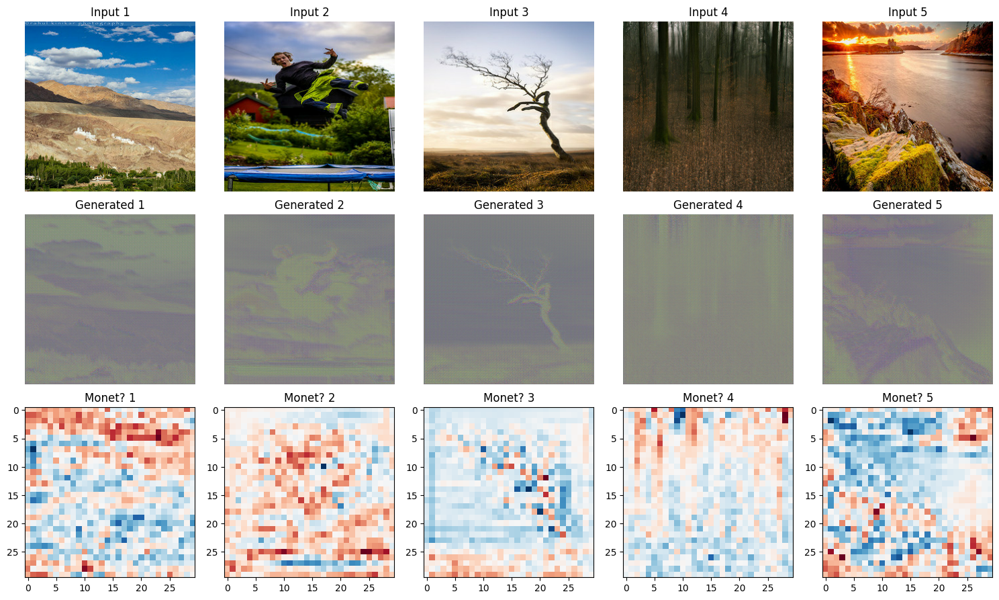

In [26]:
generate_images(generator_m, fid_photo_ds, 5, 5)

The first row presents the input photo, the second row shows the images generated by the model, and the third row demonstrates the discriminator's judgments. Here, the red areas indicate that the pixels in the generated image have been judged by the discriminator as not conforming to Monet's style, while the blue areas are deemed to conform to Monet's style.

From the generated images in the second row, it is evident that the generator has not yet been able to produce images in the Monet style. For ease of observation, the contrast of the generated images here is adjusted, and the pixel values of the generated images are magnified.

In [27]:
class CycleGan(keras.Model):
    def __init__(
        self,
        generator_m,
        generator_p,
        discriminator_m,
        discriminator_p,
    ):
        super(CycleGan, self).__init__()
        self.gen_m = generator_m
        self.gen_p = generator_p
        self.disc_m = discriminator_m
        self.disc_p = discriminator_p

    def compile(
        self,
        gen_m_optimizer,
        gen_p_optimizer,
        disc_m_optimizer,
        disc_p_optimizer,
        gen_loss_fn,
        disc_loss_fn,
        cycle_loss_fn,
        identity_loss_fn
    ):
        super(CycleGan, self).compile()
        self.gen_m_optimizer = gen_m_optimizer
        self.gen_p_optimizer = gen_p_optimizer
        self.disc_m_optimizer = disc_m_optimizer
        self.disc_p_optimizer = disc_p_optimizer
        self.gen_loss_fn = gen_loss_fn
        self.disc_loss_fn = disc_loss_fn
        self.cycle_loss_fn = cycle_loss_fn
        self.identity_loss_fn = identity_loss_fn

    def train_step(self, batch_data):
        real_monet, real_photo = batch_data

        with tf.GradientTape(persistent=True) as tape:
            # photo to monet back to photo
            fake_monet = self.gen_m(real_photo, training=True)
            cycled_photo = self.gen_p(fake_monet, training=True)

            # monet to photo back to monet
            fake_photo = self.gen_p(real_monet, training=True)
            cycled_monet = self.gen_m(fake_photo, training=True)

            # generating itself
            same_monet = self.gen_m(real_monet, training=True)
            same_photo = self.gen_p(real_photo, training=True)

            # discriminator used to check, inputing real images
            disc_real_monet = self.disc_m(real_monet, training=True)
            disc_real_photo = self.disc_p(real_photo, training=True)

            # discriminator used to check, inputing fake images
            disc_fake_monet = self.disc_m(fake_monet, training=True)
            disc_fake_photo = self.disc_p(fake_photo, training=True)

            # evaluates generator loss
            monet_gen_loss = self.gen_loss_fn(disc_fake_monet)
            photo_gen_loss = self.gen_loss_fn(disc_fake_photo)

            # evaluates total cycle consistency loss
            total_cycle_loss = self.cycle_loss_fn(real_monet, cycled_monet) + self.cycle_loss_fn(real_photo, cycled_photo)

            # evaluates total generator loss
            total_monet_gen_loss = monet_gen_loss + total_cycle_loss + self.identity_loss_fn(real_monet, same_monet)
            total_photo_gen_loss = photo_gen_loss + total_cycle_loss + self.identity_loss_fn(real_photo, same_photo)

            # evaluates discriminator loss
            monet_disc_loss = self.disc_loss_fn(disc_real_monet, disc_fake_monet)
            photo_disc_loss = self.disc_loss_fn(disc_real_photo, disc_fake_photo)

        # Calculate the gradients for generator and discriminator
        monet_generator_gradients = tape.gradient(total_monet_gen_loss,
                                                  self.gen_m.trainable_variables)
        photo_generator_gradients = tape.gradient(total_photo_gen_loss,
                                                  self.gen_p.trainable_variables)

        monet_discriminator_gradients = tape.gradient(monet_disc_loss,
                                                      self.disc_m.trainable_variables)
        photo_discriminator_gradients = tape.gradient(photo_disc_loss,
                                                      self.disc_p.trainable_variables)

#         for grad, var in zip(monet_generator_gradients, self.gen_m.trainable_variables):
#             if grad is not None:
#                 # print(f"{var.name} gradient: {tf.reduce_mean(grad).numpy()}")
#                 tf.print(f"{var.name} gradient:", tf.reduce_mean(grad))

#             else:
#                 print(f"{var.name} gradient is None")

        # Apply the gradients to the optimizer
        self.gen_m_optimizer.apply_gradients(zip(monet_generator_gradients,
                                                 self.gen_m.trainable_variables))

        self.gen_p_optimizer.apply_gradients(zip(photo_generator_gradients,
                                                 self.gen_p.trainable_variables))

        self.disc_m_optimizer.apply_gradients(zip(monet_discriminator_gradients,
                                                  self.disc_m.trainable_variables))

        self.disc_p_optimizer.apply_gradients(zip(photo_discriminator_gradients,
                                                  self.disc_p.trainable_variables))

        return {
            "monet_gen_loss": total_monet_gen_loss,
            "photo_gen_loss": total_photo_gen_loss,
            "monet_disc_loss": monet_disc_loss,
            "photo_disc_loss": photo_disc_loss
        }

In [28]:
with strategy.scope():
    generator_m_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
    generator_p_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
    discriminator_m_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
    discriminator_p_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)


## Loss functions

Loss Functions used in CycleGAN:

1. **discriminator_loss**: This calculates the loss for the discriminator. It measures how well the discriminator is able to distinguish real images from generated ones. For real images, the discriminator should output values close to 1, indicating high probability of being real, hence `tf.ones_like(real)` is used as the label; for generated images, it should output values close to 0, hence `tf.zeros_like(generated)`. The loss is the average of these two parts.

2. **generator_loss**: This calculates the loss for the generator. The generator's goal is to fool the discriminator into thinking the generated images are real, so this loss is calculated as the difference with `tf.ones_like(generated)`, trying to get the generated images judged as real.

3. **calc_cycle_loss**: This calculates the cycle consistency loss, a key feature of CycleGAN. It ensures an image translated from one domain to another and back again should resemble the original image as closely as possible. This is achieved by calculating the L1 distance between the original and cycled-back image.

4. **identity_loss**: This calculates the identity loss, used when the input should not change, that is, when the input is already an image from the target domain. It encourages the generator to leave inputs that are already in the target class unchanged. This is done by calculating the L1 distance between the input and output image.

In these functions, `LAMBDA` is a hyperparameter used to adjust the contribution of cycle loss and identity loss to the total loss.

In [29]:
LAMBDA = 10
loss_obj = BinaryCrossentropy(from_logits=True, reduction=Reduction.NONE)

def discriminator_loss(real, generated):
    real_loss = loss_obj(tf.ones_like(real), real)
    real_loss = tf.reduce_mean(real_loss)
    generated_loss = loss_obj(tf.zeros_like(generated), generated)
    generated_loss = tf.reduce_mean(generated_loss)
    total_disc_loss = real_loss + generated_loss
    return total_disc_loss * 0.5

def generator_loss(generated):
    loss = loss_obj(tf.ones_like(generated), generated)
    return tf.reduce_mean(loss)

def calc_cycle_loss(real_image, cycled_image):
    loss = tf.reduce_mean(tf.abs(real_image - cycled_image))
    return LAMBDA * loss

def identity_loss(real_image, same_image):
    loss = tf.reduce_mean(tf.abs(real_image - same_image))
    return LAMBDA * 0.5 * loss

## MiFID

**Memorization-informed Fréchet Inception Distance (MiFID)** is a variant of the **Fréchet Inception Distance (FID)** used to evaluate the quality of images generated by GANs.

The FID measures the similarity between two sets of images, typically between a set of real images and a set of generated images, by comparing their distributions in the feature space of a pre-trained Inception network.

**MiFID** modifies **FID** by considering the concept of memorization. It refers to a model's tendency to replicate training samples rather than learning general patterns. For image generation tasks, memorization would mean generating images that are too similar to the training data, which might indicate overfitting.

MiFID (Memorization-informed Fréchet Inception Distance) modifies the standard FID (Fréchet Inception Distance) by incorporating a measure of memorization. Memorization refers to how much the generated images resemble any training samples, which is undesirable in generating new content.

The memorization distance $d$ is the average minimum cosine distance from generated images to all training samples, ensuring generated images aren't too similar to training data. If $d$ is less than a threshold $\epsilon$, it indicates memorization, and $d$ is used; otherwise, the thresholded value $d_{\text{thr}}$ is set to 1.

This is expressed as:

$$d_{\text{thr}} =
\begin{cases}
d, & \text{if } d < \epsilon \\
1, & \text{otherwise}
\end{cases}
$$

MiFID is then calculated by:

$$\text{MiFID} = \frac{\text{FID}}{d_{\text{thr}}}$$

A lower MiFID indicates less memorization and better quality of the generated images.

In [30]:
def init_feature_extractor():
    incept = tf.keras.applications.InceptionV3(input_shape=(256, 256, 3), pooling='avg', include_top=False)
    mix3 = incept.get_layer('mixed3').output
    glob_pool = tf.keras.layers.GlobalAveragePooling2D()(mix3)
    feature_model = tf.keras.Model(inputs=incept.input, outputs=glob_pool)
    feature_model.trainable = False
    return feature_model

class MiFIDCalculator(object):
    def __init__(self, real_images, generator_model, model=None):
        self.model = model if model is not None else init_feature_extractor()
        self.real_images = real_images
        self.generator_model = generator_model
        self.real_features = None
        self.generated_features = None

    def _extract_features(self, images):
        return self.model.predict(images, verbose=0)

    def _calculate_fid(self, mu1, sigma1, mu2, sigma2):
        ssdiff = np.sum((mu1 - mu2)**2.0)
        covmean = sqrtm(sigma1.dot(sigma2))
        if np.iscomplexobj(covmean):
            covmean = covmean.real
        fid = ssdiff + np.trace(sigma1 + sigma2 - 2.0 * covmean)
        return fid

    def _calculate_cosine_distance(self, fg, fr):
        fg_norm = fg / np.linalg.norm(fg, axis=1, keepdims=True)
        fr_norm = fr / np.linalg.norm(fr, axis=1, keepdims=True)
        cosine_similarity = np.dot(fg_norm, fr_norm.T)
        cosine_distance = 1 - cosine_similarity
        return cosine_distance

    def _memorization_distance(self, fg, fr, epsilon=0.1):
        cosine_distance = self._calculate_cosine_distance(fg, fr)
        min_distance = np.min(cosine_distance, axis=1)
        memorization = np.mean(np.where(min_distance > epsilon, 1.0, 0.0))
        return memorization

    def calculate_mifid(self, epsilon=0.1):
        if self.real_features is None or self.generated_features is None:
            self._generated_images()
        mu_real, sigma_real = np.mean(self.real_features, axis=0), np.cov(self.real_features, rowvar=False)
        mu_gen, sigma_gen = np.mean(self.generated_features, axis=0), np.cov(self.generated_features, rowvar=False)
        fid = self._calculate_fid(mu_real, sigma_real, mu_gen, sigma_gen)
        memorization = self._memorization_distance(self.generated_features, self.real_features, epsilon)
        mifid = fid * (1 / memorization) if memorization > 0 else fid
        return mifid

    def _generated_images(self):
        self.real_features = []
        self.generated_features = []
        for images in self.real_images:
            real_features = self._extract_features(images)
            self.real_features.append(real_features)
            generated_images = self.generator_model(images, training=False)
            generated_features = self._extract_features(generated_images)
            self.generated_features.append(generated_features)
        self.real_features = np.concatenate(self.real_features, axis=0)
        self.generated_features = np.concatenate(self.generated_features, axis=0)

    def update_generated_features(self, generator_model):
        self.generator_model = generator_model
        self._generated_images()

## Callback

In [31]:
class MiFIDCallback(Callback):
    def __init__(self, calculator, epoch_interval=1, checkpoint_manager=None):
        self.calculator = calculator
        self.epoch_interval = epoch_interval
        self.checkpoint_manager = checkpoint_manager
        self.mifid_history = []
        self.best_mifid = None

    def _get_mifid(self):
        mifid = self.calculator.calculate_mifid()
        self.mifid_history.append(mifid)
        print(f' - MiFID: {mifid}')
        return mifid

    def on_epoch_end(self, epoch, logs=None):
        self.calculator.update_generated_features(self.model.gen_m)
        super().on_epoch_end(epoch, logs)
        # if epoch % self.epoch_interval == 0:
        #     mifid = self._get_mifid()
        #     if self.best_mifid is None or mifid < self.best_mifid:
        #         self.best_mifid = mifid
        #         if self.checkpoint_manager is not None:
        #             save_path = self.checkpoint_manager.save()
        #             print(f"Checkpoint saved in {save_path} at epoch {epoch}")
        mifid = self._get_mifid()
        self.best_mifid = mifid
        if self.checkpoint_manager is not None:
          save_path = self.checkpoint_manager.save()
          print(f"Checkpoint saved in {save_path} at epoch {epoch}")

    def on_train_end(self, logs=None):
        # self._get_mifid()
        # if self.checkpoint_manager is not None:
        #     save_path = self.checkpoint_manager.save()
        #     print(f"Checkpoint saved in {save_path} at last epoch")
        print('Training finished.')

    def plot_mifid_history(self):
        plt.figure(figsize=(7, 4))
        plt.plot(self.mifid_history, label='MiFID Score')
        plt.title('MiFID Score Over Epochs')
        plt.xlabel('Epoch')
        plt.ylabel('MiFID Score')
        plt.legend()
        plt.grid(True)
        plt.show()

In [32]:
ckpt = tf.train.Checkpoint(monet_generator=generator_m,
                           photo_generator=generator_p,
                           monet_discriminator=discriminator_m,
                           photo_discriminator=discriminator_p,
                           generator_m_optimizer=generator_m_optimizer,
                           discriminator_m_optimizer=discriminator_m_optimizer,
                           generator_p_optimizer=generator_p_optimizer,
                           discriminator_p_optimizer=discriminator_p_optimizer
                          )

ckpt_path = PATH + 'ckpt_5'
if not os.path.exists(ckpt_path):
    os.makedirs(ckpt_path)

ckpt_manager = tf.train.CheckpointManager(ckpt, ckpt_path, max_to_keep=20)

In [33]:
with strategy.scope():
    mifid_calculator = MiFIDCalculator(fid_photo_ds, generator_m)
    mifid_callback = MiFIDCallback(mifid_calculator, epoch_interval=1, checkpoint_manager=ckpt_manager)

87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 5s 0us/step


In [34]:
class Plot_Generated_Image(Callback):
    def __init__(self, input_image, model_generator, epoch_interval=None, nrows=1, figsize=(5, 5)):
        self.input_image = input_image
        self.model_generator = model_generator
        self.epoch_interval = epoch_interval
        self.nrows = nrows
        self.figsize=figsize

    def _plot_test_and_pred(self):
        preds = self.model_generator.predict(self.input_image, verbose=0)
        (fig, axes) = plt.subplots(nrows=self.nrows, ncols=2, figsize=self.figsize)
        if self.nrows == 1:
            axes = [axes]
        for (ax, inp, pred) in zip(axes, self.input_image, preds):
            ax[0].imshow(array_to_img(inp))
            ax[0].set_title("Input")
            ax[0].set_axis_off()
            ax[1].imshow(array_to_img(pred))
            ax[1].set_title("Generated")
            ax[1].set_axis_off()
        plt.show()

    def on_epoch_end(self, epoch, logs=None):
        if self.epoch_interval and epoch % self.epoch_interval == 0:
            self._plot_test_and_pred()

    def on_train_end(self, logs=None):
        self._plot_test_and_pred()

In [35]:
input_photo = next(iter(fid_photo_ds.take(1)))
input_photo = np.expand_dims(input_photo[0], axis=0)
with strategy.scope():
    plot_generated_image = Plot_Generated_Image(
        input_image=input_photo,
        model_generator=generator_m,
        epoch_interval=3)

## Training

In [38]:
with strategy.scope():
    cycle_gan_model = CycleGan(
        generator_m, generator_p,
        discriminator_m, discriminator_p)

    cycle_gan_model.compile(
        gen_m_optimizer = generator_m_optimizer,
        gen_p_optimizer = generator_p_optimizer,
        disc_m_optimizer = discriminator_m_optimizer,
        disc_p_optimizer = discriminator_p_optimizer,
        gen_loss_fn = generator_loss,
        disc_loss_fn = discriminator_loss,
        cycle_loss_fn = calc_cycle_loss,
        identity_loss_fn = identity_loss)

Epoch 1/13
3519/3519 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - monet_disc_loss: 0.6274 - monet_gen_loss: 2.4768 - photo_disc_loss: 0.6102 - photo_gen_loss: 2.5689 - MiFID: 11.045212172792208
Checkpoint saved in /content/drive/My Drive/Monet_Style_Images/ckpt_5/ckpt-1 at epoch 0


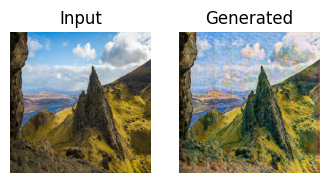

3519/3519 ━━━━━━━━━━━━━━━━━━━━ 514s 146ms/step - monet_disc_loss: 0.6274 - monet_gen_loss: 2.4768 - photo_disc_loss: 0.6102 - photo_gen_loss: 2.5689 - loss: 0.0000e+00
Epoch 2/13
3519/3519 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - monet_disc_loss: 0.6380 - monet_gen_loss: 2.3443 - photo_disc_loss: 0.6091 - photo_gen_loss: 2.4790 - MiFID: 8.502654959233572
Checkpoint saved in /content/drive/My Drive/Monet_Style_Images/ckpt_5/ckpt-2 at epoch 1
3519/3519 ━━━━━━━━━━━━━━━━━━━━ 506s 144ms/step - monet_disc_loss: 0.6380 - monet_gen_loss: 2.3443 - photo_disc_loss: 0.6091 - photo_gen_loss: 2.4790 - loss: 0.0000e+00
Epoch 3/13
3519/3519 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - monet_disc_loss: 0.6449 - monet_gen_loss: 2.2861 - photo_disc_loss: 0.6007 - photo_gen_loss: 2.4621 - MiFID: 7.29061229685659
Checkpoint saved in /content/drive/My Drive/Monet_Style_Images/ckpt_5/ckpt-3 at epoch 2
3519/3519 ━━━━━━━━━━━━━━━━━━━━ 509s 145ms/step - monet_disc_loss: 0.6449 - monet_gen_loss: 2.2861 - photo_disc_loss: 0.60

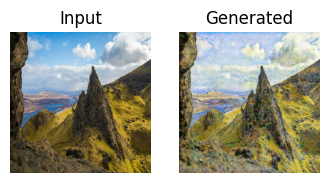

3519/3519 ━━━━━━━━━━━━━━━━━━━━ 511s 145ms/step - monet_disc_loss: 0.6447 - monet_gen_loss: 2.2695 - photo_disc_loss: 0.5944 - photo_gen_loss: 2.4699 - loss: 0.0000e+00
Epoch 5/13
3519/3519 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - monet_disc_loss: 0.6426 - monet_gen_loss: 2.2490 - photo_disc_loss: 0.5901 - photo_gen_loss: 2.4529 - MiFID: 10.141920923754586
Checkpoint saved in /content/drive/My Drive/Monet_Style_Images/ckpt_5/ckpt-5 at epoch 4
3519/3519 ━━━━━━━━━━━━━━━━━━━━ 514s 146ms/step - monet_disc_loss: 0.6426 - monet_gen_loss: 2.2490 - photo_disc_loss: 0.5901 - photo_gen_loss: 2.4529 - loss: 0.0000e+00
Epoch 6/13
3519/3519 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - monet_disc_loss: 0.6380 - monet_gen_loss: 2.2527 - photo_disc_loss: 0.5848 - photo_gen_loss: 2.4505 - MiFID: 9.16206461230869
Checkpoint saved in /content/drive/My Drive/Monet_Style_Images/ckpt_5/ckpt-6 at epoch 5
3519/3519 ━━━━━━━━━━━━━━━━━━━━ 510s 145ms/step - monet_disc_loss: 0.6380 - monet_gen_loss: 2.2527 - photo_disc_loss: 0.5

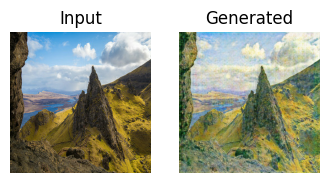

3519/3519 ━━━━━━━━━━━━━━━━━━━━ 509s 145ms/step - monet_disc_loss: 0.6334 - monet_gen_loss: 2.2777 - photo_disc_loss: 0.5835 - photo_gen_loss: 2.4653 - loss: 0.0000e+00
Epoch 8/13
3519/3519 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - monet_disc_loss: 0.6298 - monet_gen_loss: 2.2682 - photo_disc_loss: 0.5862 - photo_gen_loss: 2.4381 - MiFID: 8.324123286452583
Checkpoint saved in /content/drive/My Drive/Monet_Style_Images/ckpt_5/ckpt-8 at epoch 7
3519/3519 ━━━━━━━━━━━━━━━━━━━━ 515s 146ms/step - monet_disc_loss: 0.6298 - monet_gen_loss: 2.2682 - photo_disc_loss: 0.5862 - photo_gen_loss: 2.4381 - loss: 0.0000e+00
Epoch 9/13
3519/3519 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - monet_disc_loss: 0.6228 - monet_gen_loss: 2.2863 - photo_disc_loss: 0.5889 - photo_gen_loss: 2.4297 - MiFID: 9.994643811572297
Checkpoint saved in /content/drive/My Drive/Monet_Style_Images/ckpt_5/ckpt-9 at epoch 8
3519/3519 ━━━━━━━━━━━━━━━━━━━━ 512s 146ms/step - monet_disc_loss: 0.6228 - monet_gen_loss: 2.2863 - photo_disc_loss: 0.5

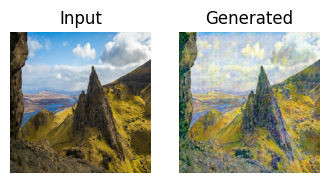

3519/3519 ━━━━━━━━━━━━━━━━━━━━ 516s 147ms/step - monet_disc_loss: 0.6140 - monet_gen_loss: 2.3093 - photo_disc_loss: 0.5897 - photo_gen_loss: 2.4180 - loss: 0.0000e+00
Epoch 11/13
3519/3519 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - monet_disc_loss: 0.6050 - monet_gen_loss: 2.3437 - photo_disc_loss: 0.5929 - photo_gen_loss: 2.4089 - MiFID: 12.002646951355135
Checkpoint saved in /content/drive/My Drive/Monet_Style_Images/ckpt_5/ckpt-11 at epoch 10
3519/3519 ━━━━━━━━━━━━━━━━━━━━ 515s 146ms/step - monet_disc_loss: 0.6050 - monet_gen_loss: 2.3437 - photo_disc_loss: 0.5929 - photo_gen_loss: 2.4089 - loss: 0.0000e+00
Epoch 12/13
3519/3519 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - monet_disc_loss: 0.5968 - monet_gen_loss: 2.3730 - photo_disc_loss: 0.5912 - photo_gen_loss: 2.4088 - MiFID: 8.378250301152654
Checkpoint saved in /content/drive/My Drive/Monet_Style_Images/ckpt_5/ckpt-12 at epoch 11
3519/3519 ━━━━━━━━━━━━━━━━━━━━ 516s 147ms/step - monet_disc_loss: 0.5968 - monet_gen_loss: 2.3730 - photo_disc_lo

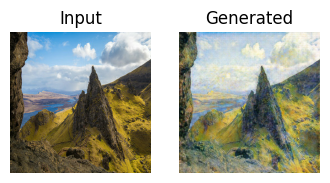

3519/3519 ━━━━━━━━━━━━━━━━━━━━ 523s 149ms/step - monet_disc_loss: 0.5906 - monet_gen_loss: 2.3987 - photo_disc_loss: 0.5937 - photo_gen_loss: 2.4080 - loss: 0.0000e+00
Training finished.


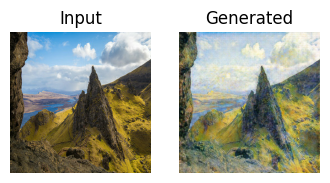

In [42]:
EPOCHS = 13

full_dataset = tf.data.Dataset.zip((monet_gan_ds, photo_gan_ds))

cycle_gan_model.fit(
    full_dataset,
    epochs=EPOCHS,
    steps_per_epoch=(max(n_monet_samples, n_photo_samples)//BATCH_SIZE),
    callbacks = [mifid_callback, plot_generated_image]
)

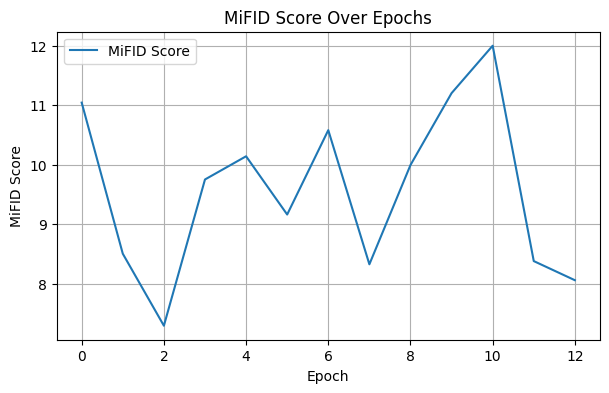

In [44]:
mifid_callback.plot_mifid_history()

The lower the MiFID score, the higher the quality of the generated images, indicating a closer approximation to the statistical characteristics of real images. 

The graph above shows a sharp decline in the MiFID score at the beginning of training, which usually signifies that the model is rapidly learning and improving its ability to generate images. Subsequently, the MiFID score undergoes fluctuations, which could be due to instabilities in the learning process or the diversity of the training data. Starting from epoch 10 (the 11th epoch in the training process), the score continues to decline, indicating a significant improvement in the quality of the generated images. Due to limited GPU computational units, I have not conducted many epochs.

In [ ]:
# def restore_checkpoint(ckpt_manager, min_mifid=False):

#     checkpoints = ckpt_manager.checkpoints
#     if not checkpoints:
#         print("No available checkpoints found.")
#         return

#     if min_mifid and len(checkpoints) > 1:
#         # If there are multiple checkpoints and restore the one with minimum MifID
#         checkpoint_to_restore = checkpoints[-2]
#     else:
#         # Otherwise, restore the checkpoint for the last epoch
#         checkpoint_to_restore = checkpoints[-1]

#     ckpt.restore(checkpoint_to_restore)
#     print(f"Checkpoint has been loaded: {checkpoint_to_restore}")


In [ ]:
#restore_checkpoint(ckpt_manager)

In [46]:
ckpts = ckpt_manager.checkpoints
for i, ckpt_path in enumerate(ckpts):
    print(f"point {i}: {ckpt_path}")

point 0: /content/drive/My Drive/Monet_Style_Images/ckpt_5/ckpt-11
point 1: /content/drive/My Drive/Monet_Style_Images/ckpt_5/ckpt-12
point 2: /content/drive/My Drive/Monet_Style_Images/ckpt_5/ckpt-13


Comparison of input and generated images at the 11th epoch:

In [49]:
ckpt.restore(ckpts[0])

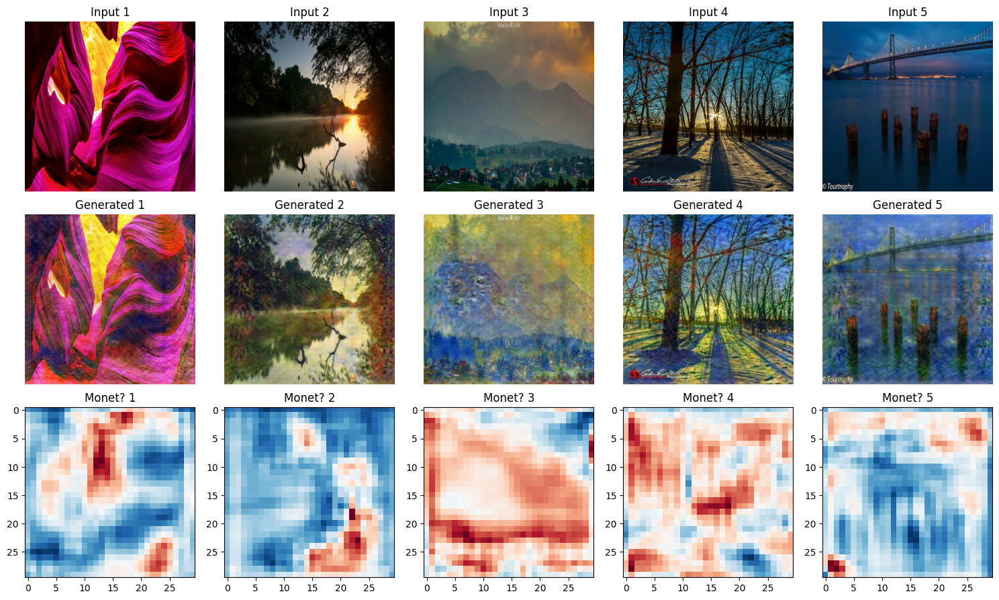

In [50]:
generate_images(generator_m, fid_photo_ds, 5, 1)

Comparison of input and generated images at the 12th epoch:

In [51]:
ckpt.restore(ckpts[1])

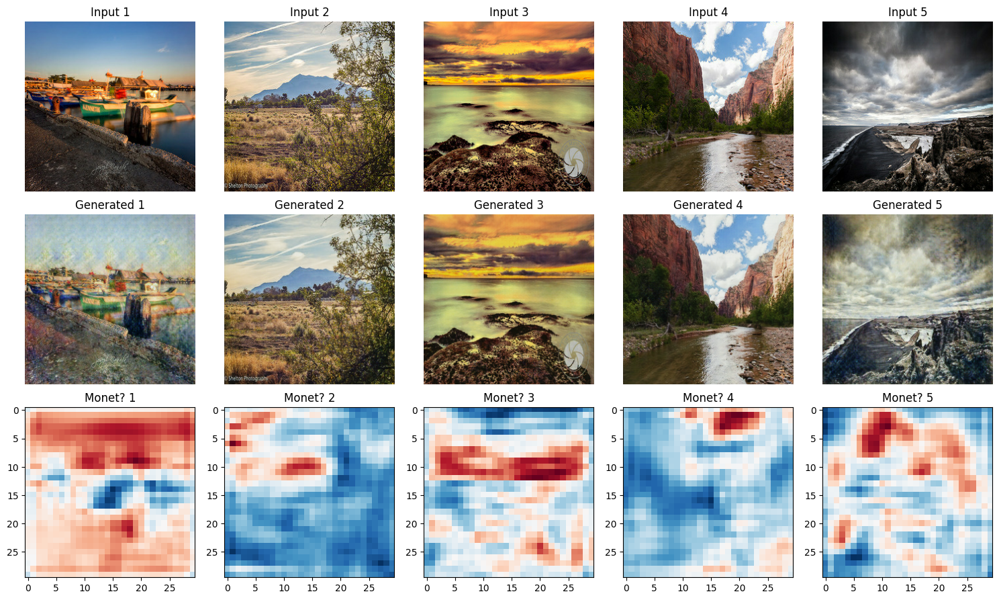

In [52]:
generate_images(generator_m, fid_photo_ds, 5, 1)

Comparison of input and generated images at the 13th epoch:

In [53]:
ckpt.restore(ckpts[2])

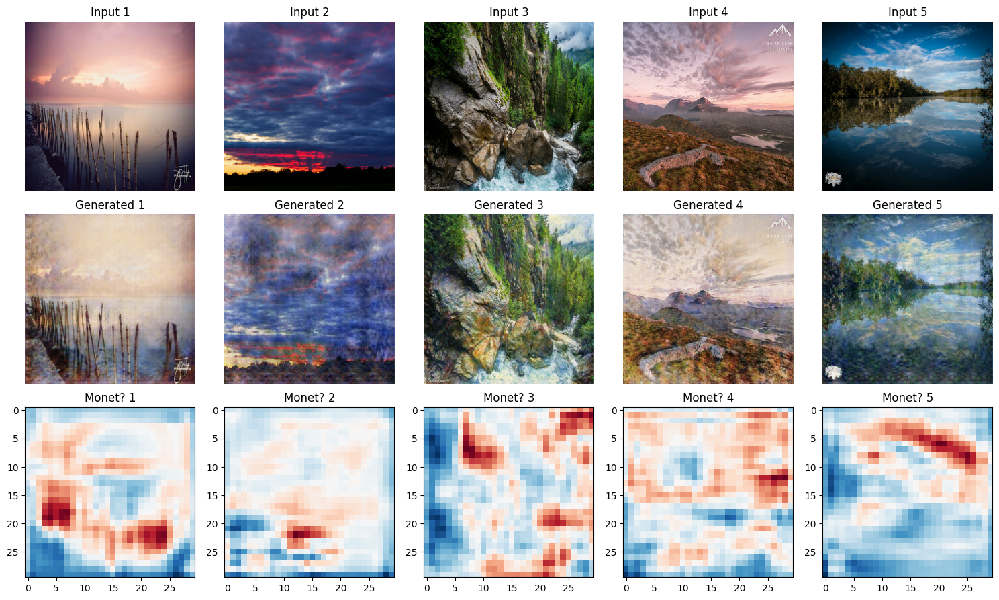

In [54]:
generate_images(generator_m, fid_photo_ds, 5, 1)

## Summary

From stylized images, generative models show good performance in capturing the main features and color compositions of the input images, yet there are subtle differences in details and textures. An improvement in the quality of generated images can be observed from the last three epochs, coming closer to real images in the Monet style, which corresponds with a decrease in the MiFID score. The model shows more accurate simulation of the Monet style in the final training cycles, indicating progress in generating stylistically consistent images.

Additionally, the increase in blue areas in the color block diagram indicates a higher proportion of images being identified by the discriminator as in the Monet Style. This suggests that the model may have captured key stylistic elements of Monet's painting style, such as color temperature, light reflection, or overall structure, representing progress in the generator's imitation of the target style. However, ideally, the discriminator in cycleGAN training should also continuously improve its performance, enabling more precise discrimination to foster progress through ongoing competition between the two.

The fluctuations during the training process may be caused by insufficient diversity in the training data, model overfitting, or the need for finer adjustments in the learning rate or other training parameters. These are areas for improvement in future model training processes.


## Submission

In [70]:
def generate_and_save(generator, ds):
    count = 0
    pred_path = PATH + 'images_5.zip'
    if os.path.exists(pred_path):
        os.remove(pred_path)
    with zipfile.ZipFile(pred_path, 'w') as zipf:
        for images_batch in ds:
            predictions = generator(images_batch, training=False)
            for pred in predictions:
                count += 1
                pred_adjusted = tf.cast(pred * 0.5 + 0.5, tf.uint8) # to [0, 1]
                generated_image = array_to_img(pred_adjusted.numpy())
                generated_image_bytes = BytesIO()
                generated_image.save(generated_image_bytes, format='JPEG')
                generated_image_bytes.seek(0)
                zipf.writestr(f'generated_image_{count}.jpg', generated_image_bytes.getvalue())
                if count % 1024 == 0:
                    print(f'Archived images: {count}')

In [71]:
%%time
generate_and_save(generator_m, test_photo_ds)

Archived images: 1024
Archived images: 2048
Archived images: 3072
Archived images: 4096
Archived images: 5120
Archived images: 6144
CPU times: user 3min 11s, sys: 1.62 s, total: 3min 12s
Wall time: 3min 11s


Kaggle score:

<img src='pic/kaggle_score.png' width=500>
<img src='pic/kaggle_entry.png' width=500>

## Reference

[Paper: Unpaired Image-to-Image Translation using Cycle-Consistent Adversarial Networks](https://arxiv.org/abs/1703.10593) <br>
[Paper: Unsupervised Representation Learning with Deep Convolutional Generative Adversarial Networks](https://arxiv.org/abs/1511.06434) <br>
[TensorFlow: Deep Convolutional Generative Adversarial Network](https://www.tensorflow.org/tutorials/generative/dcgan) <br>
[TensorFlow: pix2pix: Image-to-image translation with a conditional GAN](https://www.tensorflow.org/tutorials/generative/pix2pix) <br>
[TensorFlow: Cycle-Consistent Adversarial Networks](https://www.tensorflow.org/tutorials/generative/cyclegan) <br>
[Notebook: Two-objective discriminator](https://www.kaggle.com/code/unfriendlyai/two-objective-discriminator)